In [1]:
# ALWAYS RUN THIS FIRST!
import os
import sys
from pathlib import Path

NOTEBOOK_DIR = Path("/rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-latest")
os.chdir(NOTEBOOK_DIR)
sys.path.insert(0, str(NOTEBOOK_DIR))

print(f"✅ Working directory: {os.getcwd()}")

✅ Working directory: /rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-latest


In [3]:
#!/usr/bin/env python3
"""
CryoNuSeg Dataset Deep Exploration - Check Subdirectories
"""

import os
from pathlib import Path
import cv2
import numpy as np

BASE_PATH = Path("/rsrch9/home/plm/idso_fa1_pathology/TIER1/yasin-vitaminp/public-datasets/CryoNuSeg")

print("=" * 80)
print("🔬 CryoNuSeg Dataset - Deep Subdirectory Exploration")
print("=" * 80)

# Check tissue images
tissue_img_dir = BASE_PATH / "tissue images"
print(f"\n📸 TISSUE IMAGES:")
img_files = sorted(tissue_img_dir.glob("*.tif"))
print(f"   Total .tif images: {len(img_files)}")
if img_files:
    print(f"   First image: {img_files[0].name}")
    print(f"   Last image: {img_files[-1].name}")

# Annotator 1 (biologist) - PRIMARY GROUND TRUTH
print(f"\n{'='*80}")
print("🎯 ANNOTATOR 1 (biologist) - PRIMARY GROUND TRUTH")
print("=" * 80)

ann1_dir = BASE_PATH / "Annotator 1 (biologist)"
subdirs = [d for d in ann1_dir.iterdir() if d.is_dir()]
print(f"\nFound {len(subdirs)} subdirectories:")

for subdir in sorted(subdirs):
    files = list(subdir.glob("*.*"))
    files = [f for f in files if f.suffix.lower() in ['.png', '.tif', '.tiff', '.mat', '.npy']]
    
    print(f"\n   📁 {subdir.name}/")
    print(f"      Files: {len(files)}")
    
    if files:
        # Group by extension
        extensions = {}
        for f in files:
            ext = f.suffix.lower()
            extensions[ext] = extensions.get(ext, 0) + 1
        
        for ext, count in extensions.items():
            print(f"         {ext}: {count} files")
        
        # Analyze first file
        sample_file = files[0]
        print(f"\n      Sample file: {sample_file.name}")
        
        if sample_file.suffix.lower() in ['.png', '.tif', '.tiff']:
            mask = cv2.imread(str(sample_file), cv2.IMREAD_ANYDEPTH | cv2.IMREAD_GRAYSCALE)
            if mask is not None:
                print(f"      Shape: {mask.shape}")
                print(f"      Dtype: {mask.dtype}")
                unique_vals = np.unique(mask)
                print(f"      Unique values: {len(unique_vals)}")
                print(f"      Value range: [{mask.min()}, {mask.max()}]")
                
                if len(unique_vals) <= 20:
                    print(f"      Values: {unique_vals}")
                else:
                    print(f"      First 10: {unique_vals[:10]}")
                    print(f"      Last 10: {unique_vals[-10:]}")
                
                # Determine mask type
                if len(unique_vals) == 2:
                    print(f"      ✅ BINARY mask")
                elif len(unique_vals) > 2:
                    print(f"      ✅ INSTANCE mask ({len(unique_vals)-1} instances)")

# Check which subdirectory is best for instance masks
print(f"\n{'='*80}")
print("💡 RECOMMENDATION FOR INSTANCE SEGMENTATION:")
print("=" * 80)

# Check 'label masks' subdirectory specifically
label_mask_dir = ann1_dir / "label masks"
if label_mask_dir.exists():
    mask_files = sorted(label_mask_dir.glob("*.tif")) + sorted(label_mask_dir.glob("*.png"))
    print(f"\n✅ 'label masks/' subdirectory found")
    print(f"   Total masks: {len(mask_files)}")
    
    if mask_files:
        print(f"\n   First 5 mask files:")
        for f in mask_files[:5]:
            print(f"      - {f.name}")
        
        # Load one to verify it's instance format
        sample = cv2.imread(str(mask_files[0]), cv2.IMREAD_ANYDEPTH | cv2.IMREAD_GRAYSCALE)
        if sample is not None:
            unique = np.unique(sample)
            print(f"\n   Verification of first mask:")
            print(f"      Unique values: {len(unique)}")
            print(f"      Range: [{sample.min()}, {sample.max()}]")
            if len(unique) > 2:
                print(f"      ✅ Confirmed INSTANCE mask format")
            else:
                print(f"      ⚠️  Appears to be BINARY mask")

# Check correspondence
print(f"\n{'='*80}")
print("🔗 IMAGE-MASK CORRESPONDENCE CHECK:")
print("=" * 80)

if tissue_img_dir.exists() and label_mask_dir.exists():
    img_files = sorted(tissue_img_dir.glob("*.tif"))
    mask_files = sorted(label_mask_dir.glob("*.tif")) + sorted(label_mask_dir.glob("*.png"))
    
    print(f"\nImages: {len(img_files)}")
    print(f"Masks:  {len(mask_files)}")
    
    if img_files and mask_files:
        print(f"\nSample correspondence:")
        print(f"   Image: {img_files[0].name}")
        
        # Find matching mask
        img_stem = img_files[0].stem
        matching = [m for m in mask_files if img_stem in m.name or m.stem in img_stem]
        
        if matching:
            print(f"   Mask:  {matching[0].name}")
            print(f"   ✅ Match found!")
        else:
            print(f"   Mask stem example: {mask_files[0].stem}")
            print(f"   ⚠️  Need to check naming pattern")

# Check other annotators briefly
print(f"\n{'='*80}")
print("📊 OTHER ANNOTATORS (for reference):")
print("=" * 80)

for annotator_name in ["Annotator 1 (biologist second round of manual marks up)", 
                       "Annotator 2 (bioinformatician)"]:
    ann_dir = BASE_PATH / annotator_name
    if ann_dir.exists():
        print(f"\n{annotator_name}:")
        
        # Look for nested directory
        subdirs = [d for d in ann_dir.iterdir() if d.is_dir()]
        if subdirs:
            for subdir in subdirs:
                # Check for label masks inside
                label_masks = subdir / "label masks"
                if label_masks.exists():
                    files = list(label_masks.glob("*.tif")) + list(label_masks.glob("*.png"))
                    print(f"   label masks/: {len(files)} files")

print("\n" + "=" * 80)
print("✅ Deep Exploration Complete!")
print("=" * 80)
print("\n🎯 SUMMARY:")
print("   Images location: tissue images/*.tif")
print("   Primary masks: Annotator 1 (biologist)/label masks/*.tif or *.png")
print("   Use 'label masks' subdirectory for instance segmentation")
print("=" * 80)

🔬 CryoNuSeg Dataset - Deep Subdirectory Exploration

📸 TISSUE IMAGES:
   Total .tif images: 30
   First image: Human_AdrenalGland_01.tif
   Last image: Human_ThyroidGland_03.tif

🎯 ANNOTATOR 1 (biologist) - PRIMARY GROUND TRUTH

Found 10 subdirectories:

   📁 Imagj_zips/
      Files: 0

   📁 distance maps/
      Files: 30
         .png: 30 files

      Sample file: Human_AdrenalGland_01.png
      Shape: (512, 512)
      Dtype: uint8
      Unique values: 106
      Value range: [0, 255]
      First 10: [ 0 13 18 25 28 36 38 40 45 50]
      Last 10: [231 232 234 238 241 242 245 248 250 255]
      ✅ INSTANCE mask (105 instances)

   📁 label masks/
      Files: 30
         .tif: 30 files

      Sample file: Human_AdrenalGland_01.tif
      Shape: (512, 512)
      Dtype: uint16
      Unique values: 90
      Value range: [0, 157]
      First 10: [0 1 2 3 4 5 6 7 8 9]
      Last 10: [ 80  81  82  83  84  85 105 144 153 157]
      ✅ INSTANCE mask (89 instances)

   📁 label masks modify/
      Fi

In [4]:
import os
import glob
import numpy as np
import zarr
import pandas as pd
import cv2
from pathlib import Path
from tqdm import tqdm
import numcodecs
from sklearn.model_selection import train_test_split

# --- CONFIGURATION ---
BASE_PATH = Path("/rsrch9/home/plm/idso_fa1_pathology/TIER1/yasin-vitaminp/public-datasets/CryoNuSeg")
OUTPUT_BASE = Path("/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/cryonuseg/zarr_data")

# Following standard split ratios with fixed random state for reproducibility
RANDOM_STATE = 42
TRAIN_RATIO = 0.70  # 70% train
VAL_RATIO = 0.15    # 15% val
TEST_RATIO = 0.15   # 15% test

# CryoNuSeg images are already 512x512, no patching needed
IMAGE_SIZE = 512
cv2.setNumThreads(0)

# All 10 organ types in CryoNuSeg dataset
ALL_ORGANS = [
    'AdrenalGland',
    'Larynx',
    'LymphNodes',
    'Mediastinum',
    'Pancreas',
    'Pleura',
    'Skin',
    'Testis',
    'Thymus',
    'ThyroidGland'
]

# ---------------------------------------------------------------------
# 1. Process Single Image Pair
# ---------------------------------------------------------------------
def process_image_pair(img_path, mask_path, organ_name):
    """
    Process one image+mask pair from CryoNuSeg:
    1. Load image from 'tissue images' folder (TIF, RGB)
    2. Load instance mask from 'label masks' folder (TIF, uint16 instance format)
    3. Images are already 512x512, no patching needed
    """
    try:
        # --- A. Load Image (TIF) ---
        img = cv2.imread(str(img_path))
        if img is None:
            print(f"⚠️  Cannot read image: {img_path}")
            return None
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h_img, w_img = img.shape[:2]
        
        # Verify size
        if h_img != IMAGE_SIZE or w_img != IMAGE_SIZE:
            print(f"⚠️  Unexpected image size: {img_path} - {img.shape}")
            return None
        
        # --- B. Load Instance Mask (TIF - already in instance format) ---
        instance_mask = cv2.imread(str(mask_path), cv2.IMREAD_ANYDEPTH | cv2.IMREAD_GRAYSCALE)
        if instance_mask is None:
            print(f"⚠️  Cannot read mask: {mask_path}")
            return None
        
        # Convert to int32 for instance IDs
        instance_mask = instance_mask.astype(np.int32)
        
        # Verify mask size
        if instance_mask.shape[0] != IMAGE_SIZE or instance_mask.shape[1] != IMAGE_SIZE:
            print(f"⚠️  Unexpected mask size: {mask_path} - {instance_mask.shape}")
            return None
        
        # --- C. Create metadata ---
        metadata = {
            'organ_type': organ_name,
            'original_file': img_path.name,
            'original_height': h_img,
            'original_width': w_img
        }
        
        return {
            'image': img,
            'mask': instance_mask,
            'metadata': metadata
        }
    
    except Exception as e:
        print(f"❌ Error processing {img_path.name}: {e}")
        import traceback
        traceback.print_exc()
        return None

# ---------------------------------------------------------------------
# 2. Collect All Image-Mask Pairs
# ---------------------------------------------------------------------
def collect_all_pairs():
    """
    Scan tissue images directory and collect (image, mask, organ) tuples.
    Images and masks are in separate directories but have matching filenames.
    """
    img_dir = BASE_PATH / "tissue images"
    mask_dir = BASE_PATH / "Annotator 1 (biologist)" / "label masks"
    
    if not img_dir.exists():
        raise FileNotFoundError(f"Image directory not found: {img_dir}")
    
    if not mask_dir.exists():
        raise FileNotFoundError(f"Mask directory not found: {mask_dir}")
    
    all_pairs = []
    
    # Get all TIF images
    img_files = sorted(img_dir.glob("*.tif"))
    
    print(f"Found {len(img_files)} images in {img_dir}")
    
    for img_path in img_files:
        # Extract organ name from filename (e.g., "Human_AdrenalGland_01.tif" -> "AdrenalGland")
        filename = img_path.stem  # "Human_AdrenalGland_01"
        parts = filename.split('_')
        
        if len(parts) >= 2:
            organ_name = parts[1]  # "AdrenalGland"
        else:
            organ_name = "Unknown"
        
        # Construct corresponding mask path (same filename)
        mask_path = mask_dir / (img_path.stem + ".tif")
        
        if mask_path.exists():
            all_pairs.append((img_path, mask_path, organ_name))
        else:
            print(f"   ⚠️  No mask for {img_path.name}")
    
    return all_pairs

# ---------------------------------------------------------------------
# 3. Split Data into Train/Val/Test
# ---------------------------------------------------------------------
def split_data(all_pairs):
    """
    Split image pairs into train/val/test.
    Uses sklearn with fixed random_state for reproducibility.
    """
    np.random.seed(RANDOM_STATE)
    
    # First split: separate test set
    train_val_pairs, test_pairs = train_test_split(
        all_pairs,
        test_size=TEST_RATIO,
        random_state=RANDOM_STATE,
        shuffle=True
    )
    
    # Second split: separate validation from training
    val_size_adjusted = VAL_RATIO / (TRAIN_RATIO + VAL_RATIO)
    train_pairs, val_pairs = train_test_split(
        train_val_pairs,
        test_size=val_size_adjusted,
        random_state=RANDOM_STATE,
        shuffle=True
    )
    
    return train_pairs, val_pairs, test_pairs

# ---------------------------------------------------------------------
# 4. Process and Save Split
# ---------------------------------------------------------------------
def process_split(pairs, split_name):
    """
    Process all image pairs for a split and save to zarr.
    """
    if not pairs:
        print(f"⚠️  No pairs for {split_name}")
        return 0, 0
    
    print(f"\n📂 Processing {split_name} ({len(pairs)} images)")
    
    # Process all pairs
    results = []
    for img_path, mask_path, organ in tqdm(pairs, desc=f"  {split_name}", leave=False):
        result = process_image_pair(img_path, mask_path, organ)
        if result is not None:
            results.append(result)
    
    if not results:
        print(f"⚠️  No valid results for {split_name}")
        return 0, 0
    
    # --- Aggregate All Images ---
    all_images = []
    all_masks = []
    all_metadata = []
    
    for result in results:
        all_images.append(result['image'])
        all_masks.append(result['mask'])
        all_metadata.append(result['metadata'])
    
    # Stack all images
    final_images = np.stack(all_images, axis=0)  # Shape: (N, 512, 512, 3)
    final_masks = np.stack(all_masks, axis=0)    # Shape: (N, 512, 512)
    
    # --- Save to Zarr ---
    split_dir = OUTPUT_BASE / split_name
    os.makedirs(split_dir, exist_ok=True)
    compressor = numcodecs.Blosc(cname='zstd', clevel=3)
    
    # Save images
    z_img = zarr.open_array(
        str(split_dir / 'images.zarr'),
        mode='w',
        shape=final_images.shape,
        chunks=(1, 512, 512, 3),
        dtype='uint8',
        compressor=compressor
    )
    z_img[:] = final_images
    
    # Save instance masks
    z_mask = zarr.open_array(
        str(split_dir / 'nuclei_masks.zarr'),
        mode='w',
        shape=final_masks.shape,
        chunks=(1, 512, 512),
        dtype='int32',
        compressor=compressor
    )
    z_mask[:] = final_masks
    
    # Save metadata
    pd.DataFrame(all_metadata).to_csv(
        split_dir / 'metadata.csv',
        index=False
    )
    
    # Get instance stats
    unique_instances = np.unique(final_masks)
    num_instances = len(unique_instances[unique_instances > 0])
    
    print(f"   ✅ {split_name}: {len(final_images)} images, {num_instances} nuclei instances")
    
    return len(final_images), num_instances

# ---------------------------------------------------------------------
# 5. Main Processing Pipeline
# ---------------------------------------------------------------------
def main():
    print("=" * 70)
    print("🔬 CryoNuSeg Dataset → Zarr with Train/Val/Test Split")
    print("=" * 70)
    
    # Collect all image-mask pairs
    print("\n📊 Collecting all image-mask pairs...")
    all_pairs = collect_all_pairs()
    
    print(f"\n✅ Found {len(all_pairs)} total image-mask pairs")
    
    # Count per organ
    organ_counts = {}
    for _, _, organ in all_pairs:
        organ_counts[organ] = organ_counts.get(organ, 0) + 1
    
    print("\n📊 Images per organ:")
    for organ, count in sorted(organ_counts.items()):
        print(f"   {organ}: {count}")
    
    # Split data
    print(f"\n📂 Splitting data (seed={RANDOM_STATE}):")
    print(f"   Train: {TRAIN_RATIO*100:.0f}%")
    print(f"   Val:   {VAL_RATIO*100:.0f}%")
    print(f"   Test:  {TEST_RATIO*100:.0f}%")
    
    train_pairs, val_pairs, test_pairs = split_data(all_pairs)
    
    print(f"\n   Train: {len(train_pairs)} images")
    print(f"   Val:   {len(val_pairs)} images")
    print(f"   Test:  {len(test_pairs)} images")
    
    # Create output directory
    OUTPUT_BASE.mkdir(parents=True, exist_ok=True)
    
    # Process each split
    train_images, train_nuclei = process_split(train_pairs, 'cryonuseg_train')
    val_images, val_nuclei = process_split(val_pairs, 'cryonuseg_val')
    test_images, test_nuclei = process_split(test_pairs, 'cryonuseg_test')
    
    # --- Summary Statistics ---
    print("\n" + "=" * 70)
    print("✅ PROCESSING COMPLETE")
    print("=" * 70)
    print(f"Total images processed: {len(all_pairs)}")
    print(f"Total images in zarr: {train_images + val_images + test_images}")
    print(f"Total nuclei instances: {train_nuclei + val_nuclei + test_nuclei}")
    
    print("\n" + "─" * 70)
    print("📊 Per-Split Statistics:")
    print("─" * 70)
    
    splits = [
        ('cryonuseg_train', len(train_pairs), train_images, train_nuclei),
        ('cryonuseg_val', len(val_pairs), val_images, val_nuclei),
        ('cryonuseg_test', len(test_pairs), test_images, test_nuclei)
    ]
    
    for split_name, num_imgs, num_images, num_nuclei in splits:
        print(f"\n{split_name.upper()}:")
        print(f"   Images: {num_images}")
        print(f"   Total nuclei: {num_nuclei}")
        if num_images > 0:
            print(f"   Avg nuclei/image: {num_nuclei/num_images:.1f}")
    
    print("\n" + "=" * 70)
    print(f"Output directory: {OUTPUT_BASE}")
    print("=" * 70)
    
    # Create split info file
    create_split_info_file(all_pairs, train_pairs, val_pairs, test_pairs, organ_counts)

def create_split_info_file(all_pairs, train_pairs, val_pairs, test_pairs, organ_counts):
    """Create a text file documenting the split."""
    info_file = OUTPUT_BASE / "split_info.txt"
    
    with open(info_file, 'w') as f:
        f.write("CryoNuSeg Dataset Split Information\n")
        f.write("=" * 70 + "\n\n")
        f.write("Dataset: CryoNuSeg (Cryosectioned H&E-Stained Histological Images)\n")
        f.write("Source: 10 human organs from frozen tissue samples\n")
        f.write("Image size: 512x512 pixels (no patching needed)\n")
        f.write("Annotator: Annotator 1 (biologist) - first round (PRIMARY GROUND TRUTH)\n\n")
        
        f.write("Split Strategy: Random split across all organs\n")
        f.write(f"Random seed: {RANDOM_STATE}\n")
        f.write(f"Split ratio: {TRAIN_RATIO:.0%} train / {VAL_RATIO:.0%} val / {TEST_RATIO:.0%} test\n\n")
        
        f.write(f"Total images: {len(all_pairs)}\n")
        f.write(f"  Train: {len(train_pairs)}\n")
        f.write(f"  Val:   {len(val_pairs)}\n")
        f.write(f"  Test:  {len(test_pairs)}\n\n")
        
        f.write("Images per organ:\n")
        f.write("-" * 70 + "\n")
        for organ, count in sorted(organ_counts.items()):
            f.write(f"  {organ}: {count}\n")
        
        f.write("\n" + "=" * 70 + "\n")
        f.write("Directory Structure:\n")
        f.write("  cryonuseg_train/\n")
        f.write("    ├── images.zarr\n")
        f.write("    ├── nuclei_masks.zarr\n")
        f.write("    └── metadata.csv\n")
        f.write("  cryonuseg_val/\n")
        f.write("    └── (same structure)\n")
        f.write("  cryonuseg_test/\n")
        f.write("    └── (same structure)\n")
        f.write("\n" + "=" * 70 + "\n")
        f.write("Data Format:\n")
        f.write("  images.zarr: uint8, shape (N, 512, 512, 3)\n")
        f.write("  nuclei_masks.zarr: int32, shape (N, 512, 512)\n")
        f.write("                     Instance format: 0=background, 1,2,3...=nuclei IDs\n")
        f.write("  metadata.csv: organ_type, original_file, original_height, original_width\n")
    
    print(f"\n📄 Split info saved to: {info_file}")

if __name__ == "__main__":
    main()

🔬 CryoNuSeg Dataset → Zarr with Train/Val/Test Split

📊 Collecting all image-mask pairs...
Found 30 images in /rsrch9/home/plm/idso_fa1_pathology/TIER1/yasin-vitaminp/public-datasets/CryoNuSeg/tissue images

✅ Found 30 total image-mask pairs

📊 Images per organ:
   AdrenalGland: 3
   Larynx: 3
   LymphNodes: 3
   Mediastinum: 3
   Pancreas: 3
   Pleura: 3
   Skin: 3
   Testes: 3
   Thymus: 3
   ThyroidGland: 3

📂 Splitting data (seed=42):
   Train: 70%
   Val:   15%
   Test:  15%

   Train: 20 images
   Val:   5 images
   Test:  5 images

📂 Processing cryonuseg_train (20 images)


   ✅ cryonuseg_train: 20 images, 793 nuclei instances

📂 Processing cryonuseg_val (5 images)


   ✅ cryonuseg_val: 5 images, 675 nuclei instances

📂 Processing cryonuseg_test (5 images)


   ✅ cryonuseg_test: 5 images, 598 nuclei instances

✅ PROCESSING COMPLETE
Total images processed: 30
Total images in zarr: 30
Total nuclei instances: 2066

──────────────────────────────────────────────────────────────────────
📊 Per-Split Statistics:
──────────────────────────────────────────────────────────────────────

CRYONUSEG_TRAIN:
   Images: 20
   Total nuclei: 793
   Avg nuclei/image: 39.6

CRYONUSEG_VAL:
   Images: 5
   Total nuclei: 675
   Avg nuclei/image: 135.0

CRYONUSEG_TEST:
   Images: 5
   Total nuclei: 598
   Avg nuclei/image: 119.6

Output directory: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/cryonuseg/zarr_data

📄 Split info saved to: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/cryonuseg/zarr_data/split_info.txt


In [6]:
import zarr
import numpy as np
from pathlib import Path
from tqdm import tqdm

# --- CONFIGURATION ---
ZARR_DATA_ROOT = Path("/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/cryonuseg/zarr_data")

def renumber_instance_mask(mask):
    """
    Renumber instance mask to have contiguous IDs starting from 1.
    
    Input:  mask with IDs like [0, 1, 5, 7, 872, ...]
    Output: mask with IDs like [0, 1, 2, 3, 4, ...]
    
    Background (0) stays 0, all other instances get sequential IDs.
    """
    # Get all unique instance IDs
    unique_ids = np.unique(mask)
    
    # Remove background (0)
    unique_ids = unique_ids[unique_ids > 0]
    
    if len(unique_ids) == 0:
        # No instances, return as-is
        return mask.copy()
    
    # Create a mapping from old IDs to new contiguous IDs
    # old_id -> new_id (1, 2, 3, ...)
    id_mapping = {old_id: new_id for new_id, old_id in enumerate(unique_ids, start=1)}
    
    # Add background mapping
    id_mapping[0] = 0
    
    # Create output mask
    renumbered_mask = np.zeros_like(mask, dtype=np.int32)
    
    # Apply mapping
    for old_id, new_id in id_mapping.items():
        renumbered_mask[mask == old_id] = new_id
    
    return renumbered_mask

def verify_contiguous(mask):
    """Check if instance IDs are contiguous"""
    unique_ids = np.unique(mask)
    unique_ids = unique_ids[unique_ids > 0]  # Remove background
    
    if len(unique_ids) == 0:
        return True, 0, 0
    
    max_id = unique_ids.max()
    num_instances = len(unique_ids)
    
    is_contiguous = (num_instances == max_id)
    
    return is_contiguous, num_instances, max_id

def repair_split(split_path, split_name, dry_run=False):
    """
    Repair non-contiguous instance IDs in a single split.
    
    Args:
        split_path: Path to the split directory
        split_name: Name of the split (for logging)
        dry_run: If True, only check without modifying
    """
    print(f"\n{'='*70}")
    print(f"🔧 Processing {split_name}")
    print(f"{'='*70}")
    
    mask_path = split_path / "nuclei_masks.zarr"
    
    if not mask_path.exists():
        print(f"⚠️  Mask file not found: {mask_path}")
        return
    
    try:
        # Open zarr array
        if dry_run:
            z_msk = zarr.open(str(mask_path), mode='r')
        else:
            z_msk = zarr.open(str(mask_path), mode='r+')  # Read-write mode
        
        num_images = z_msk.shape[0]
        print(f"Total images: {num_images}")
        
        # Statistics
        non_contiguous_count = 0
        total_instances_before = 0
        total_instances_after = 0
        max_id_before = 0
        max_id_after = 0
        
        print(f"\n{'Action:':<15} {'Checking' if dry_run else 'Repairing'} instance IDs...")
        
        # Process each image
        for idx in tqdm(range(num_images), desc=f"  {split_name}"):
            mask = z_msk[idx]
            
            # Check if contiguous
            is_contiguous, num_instances, max_id = verify_contiguous(mask)
            
            total_instances_before += num_instances
            max_id_before = max(max_id_before, max_id)
            
            if not is_contiguous:
                non_contiguous_count += 1
                
                if not dry_run:
                    # Renumber the mask
                    renumbered_mask = renumber_instance_mask(mask)
                    
                    # Write back to zarr
                    z_msk[idx] = renumbered_mask
                    
                    # Verify the fix
                    is_cont_after, num_inst_after, max_id_aft = verify_contiguous(renumbered_mask)
                    
                    total_instances_after += num_inst_after
                    max_id_after = max(max_id_after, max_id_aft)
                    
                    # Sanity check: number of instances should be the same
                    if num_instances != num_inst_after:
                        print(f"\n⚠️  Warning: Image {idx} instance count changed: {num_instances} -> {num_inst_after}")
                else:
                    total_instances_after += num_instances
                    max_id_after = max(max_id_after, max_id)
            else:
                # Already contiguous
                total_instances_after += num_instances
                max_id_after = max(max_id_after, max_id)
        
        # Print summary
        print(f"\n{'─'*70}")
        print(f"Summary for {split_name}:")
        print(f"{'─'*70}")
        print(f"   Images processed: {num_images}")
        print(f"   Non-contiguous images: {non_contiguous_count}")
        
        if dry_run:
            print(f"\n   Before repair:")
            print(f"      Total instances: {total_instances_before}")
            print(f"      Max instance ID: {max_id_before}")
            print(f"      ID efficiency: {total_instances_before}/{max_id_before} = {100*total_instances_before/max_id_before if max_id_before > 0 else 0:.1f}%")
        else:
            print(f"\n   Before repair:")
            print(f"      Total instances: {total_instances_before}")
            print(f"      Max instance ID: {max_id_before}")
            
            print(f"\n   After repair:")
            print(f"      Total instances: {total_instances_after}")
            print(f"      Max instance ID: {max_id_after}")
            print(f"      ID efficiency: {total_instances_after}/{max_id_after} = {100*total_instances_after/max_id_after if max_id_after > 0 else 0:.1f}%")
            
            if total_instances_before == total_instances_after:
                print(f"\n   ✅ Instance count preserved!")
            else:
                print(f"\n   ⚠️  Instance count changed: {total_instances_before} -> {total_instances_after}")
        
    except Exception as e:
        print(f"\n❌ Error processing {split_name}: {e}")
        import traceback
        traceback.print_exc()

def repair_dataset(root_path, dry_run=True):
    """
    Repair all splits in the dataset.
    
    Args:
        root_path: Root path to zarr data
        dry_run: If True, only check without modifying (default: True)
    """
    print("="*70)
    if dry_run:
        print("🔍 DRY RUN - Checking CryoNuSeg Dataset (No Changes)")
    else:
        print("🔧 REPAIRING CryoNuSeg Dataset Instance IDs")
    print("="*70)
    
    if not root_path.exists():
        print(f"❌ Path not found: {root_path}")
        return
    
    # Get all splits
    splits = ['cryonuseg_train', 'cryonuseg_val', 'cryonuseg_test']
    available_splits = [s for s in splits if (root_path / s).exists()]
    
    if not available_splits:
        print("⚠️  No split directories found")
        return
    
    print(f"\nFound {len(available_splits)} splits: {', '.join(available_splits)}")
    
    if dry_run:
        print("\n⚠️  DRY RUN MODE - No changes will be made")
        print("   Run with dry_run=False to actually repair the dataset")
    else:
        print("\n⚠️  WRITE MODE - Dataset will be modified!")
        
        # Safety confirmation
        response = input("\n   Are you sure you want to modify the dataset? (yes/no): ")
        if response.lower() != 'yes':
            print("   Aborted.")
            return
    
    # Process each split
    for split_name in available_splits:
        split_path = root_path / split_name
        repair_split(split_path, split_name, dry_run=dry_run)
    
    # Final summary
    print("\n" + "="*70)
    if dry_run:
        print("✅ DRY RUN COMPLETE")
        print("="*70)
        print("\nTo actually repair the dataset, run:")
        print("   repair_dataset(ZARR_DATA_ROOT, dry_run=False)")
    else:
        print("✅ REPAIR COMPLETE")
        print("="*70)
        print("\nDataset has been repaired!")
        print("Run verify_cryonuseg_zarr.py to confirm the fix.")
    print("="*70)

def verify_repair(root_path):
    """Quick verification that all instance IDs are now contiguous"""
    print("\n" + "="*70)
    print("🔍 VERIFICATION - Checking if repair was successful")
    print("="*70)
    
    splits = ['cryonuseg_train', 'cryonuseg_val', 'cryonuseg_test']
    available_splits = [s for s in splits if (root_path / s).exists()]
    
    all_good = True
    
    for split_name in available_splits:
        split_path = root_path / split_name
        mask_path = split_path / "nuclei_masks.zarr"
        
        if not mask_path.exists():
            continue
        
        try:
            z_msk = zarr.open(str(mask_path), mode='r')
            num_images = z_msk.shape[0]
            
            non_contiguous = []
            
            for idx in range(num_images):
                mask = z_msk[idx]
                is_contiguous, num_instances, max_id = verify_contiguous(mask)
                
                if not is_contiguous:
                    non_contiguous.append(f"Image {idx}: {num_instances} instances, max ID {max_id}")
                    all_good = False
            
            if non_contiguous:
                print(f"\n⚠️  {split_name}: Still has non-contiguous IDs:")
                for msg in non_contiguous[:5]:
                    print(f"      {msg}")
            else:
                print(f"\n✅ {split_name}: All instance IDs are contiguous!")
        
        except Exception as e:
            print(f"\n❌ Error checking {split_name}: {e}")
            all_good = False
    
    print("\n" + "="*70)
    if all_good:
        print("✅ ALL SPLITS VERIFIED - Instance IDs are contiguous!")
    else:
        print("⚠️  Some issues remain - check output above")
    print("="*70)

if __name__ == "__main__":
    # Step 1: Dry run - check what would be changed (SAFE)
    print("\n" + "="*70)
    print("STEP 1: DRY RUN - Checking the dataset")
    print("="*70)
    repair_dataset(ZARR_DATA_ROOT, dry_run=True)
    
    # Step 2: Uncomment to actually repair (MODIFIES DATA)
    # print("\n\n" + "="*70)
    # print("STEP 2: REPAIR - Modifying the dataset")
    # print("="*70)
    # repair_dataset(ZARR_DATA_ROOT, dry_run=False)
    
    # Step 3: Verify repair (run after Step 2)
    # print("\n\n")
    # verify_repair(ZARR_DATA_ROOT)


STEP 1: DRY RUN - Checking the dataset
🔍 DRY RUN - Checking CryoNuSeg Dataset (No Changes)

Found 3 splits: cryonuseg_train, cryonuseg_val, cryonuseg_test

⚠️  DRY RUN MODE - No changes will be made
   Run with dry_run=False to actually repair the dataset

🔧 Processing cryonuseg_train
Total images: 20

Action:         Checking instance IDs...


  cryonuseg_train: 100%|██████████| 20/20 [00:00<00:00, 100.48it/s]



──────────────────────────────────────────────────────────────────────
Summary for cryonuseg_train:
──────────────────────────────────────────────────────────────────────
   Images processed: 20
   Non-contiguous images: 20

   Before repair:
      Total instances: 5662
      Max instance ID: 1259
      ID efficiency: 5662/1259 = 449.7%

🔧 Processing cryonuseg_val
Total images: 5

Action:         Checking instance IDs...


  cryonuseg_val: 100%|██████████| 5/5 [00:00<00:00, 101.67it/s]



──────────────────────────────────────────────────────────────────────
Summary for cryonuseg_val:
──────────────────────────────────────────────────────────────────────
   Images processed: 5
   Non-contiguous images: 5

   Before repair:
      Total instances: 1502
      Max instance ID: 1540
      ID efficiency: 1502/1540 = 97.5%

🔧 Processing cryonuseg_test
Total images: 5

Action:         Checking instance IDs...


  cryonuseg_test: 100%|██████████| 5/5 [00:00<00:00, 107.96it/s]


──────────────────────────────────────────────────────────────────────
Summary for cryonuseg_test:
──────────────────────────────────────────────────────────────────────
   Images processed: 5
   Non-contiguous images: 5

   Before repair:
      Total instances: 1324
      Max instance ID: 1026
      ID efficiency: 1324/1026 = 129.0%

✅ DRY RUN COMPLETE

To actually repair the dataset, run:
   repair_dataset(ZARR_DATA_ROOT, dry_run=False)



🔍 DATA INTEGRITY CHECK

   cryonuseg_train: Found 10 organ types: Mediastinum, Thymus, ThyroidGland, Pancreas, Larynx, AdrenalGland, Testes, LymphNodes, Skin, Pleura

   cryonuseg_train: Checking instance IDs...
      ⚠️  Non-contiguous instance IDs detected:
         Image 0: 362 instances but max ID is 872
         Image 1: 644 instances but max ID is 1165
         Image 2: 166 instances but max ID is 304

   cryonuseg_val: Found 5 organ types: Pancreas, Thymus, Mediastinum, Skin, AdrenalGland

   cryonuseg_val: Checking instance IDs...
      ⚠️  Non-contiguous instance IDs detected:
         Image 0: 241 instances but max ID is 438
         Image 1: 315 instances but max ID is 569
         Image 2: 674 instances but max ID is 1540

   cryonuseg_test: Found 4 organ types: ThyroidGland, Pleura, Testes, LymphNodes

   cryonuseg_test: Checking instance IDs...
      ⚠️  Non-contiguous instance IDs detected:
         Image 0: 125 instances but max ID is 225
         Image 1: 185 instance

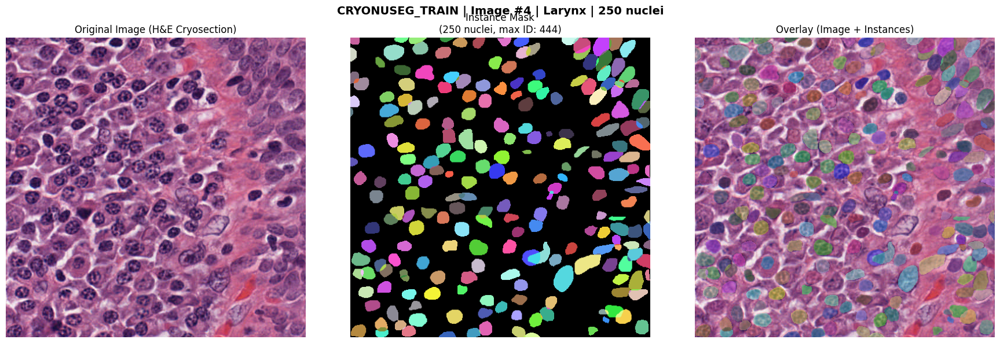

        ✅ Visualization complete

   [2/3] Image #16
        Nuclei count: 269
        Nuclei size range: 1-857 pixels (avg: 224)
        Organ type: Testes
        Original file: Human_Testes_02.tif


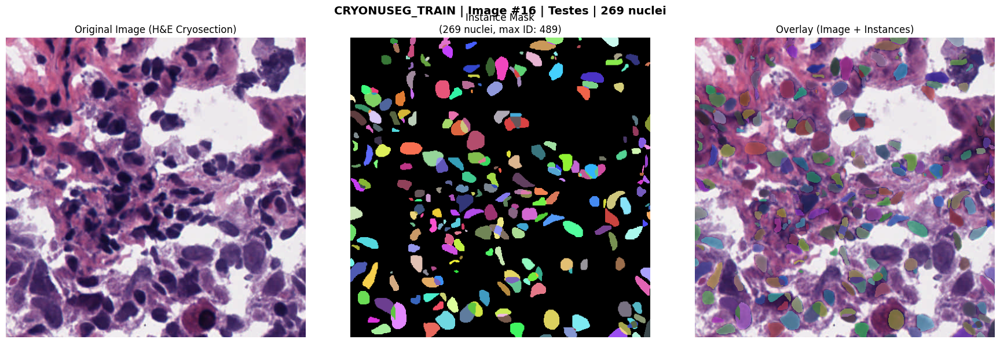

        ✅ Visualization complete

   [3/3] Image #9
        Nuclei count: 89
        Nuclei size range: 3-1492 pixels (avg: 349)
        Organ type: AdrenalGland
        Original file: Human_AdrenalGland_01.tif


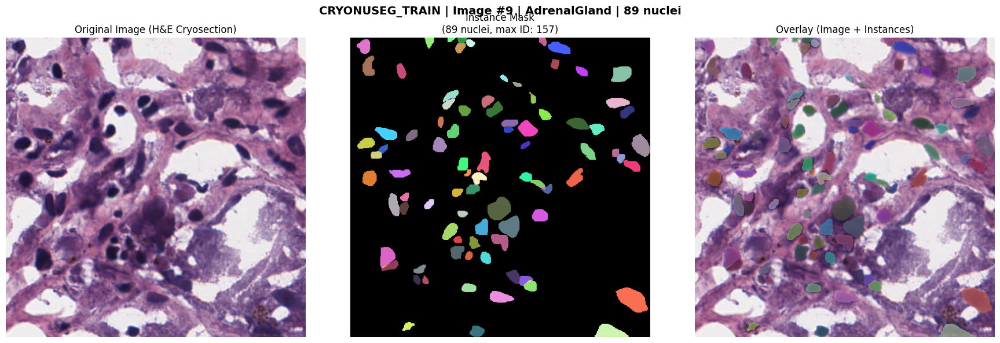

        ✅ Visualization complete

──────────────────────────────────────────────────────────────────────
📊 CRYONUSEG_VAL
   Total images: 5
   Showing: 3 random images
──────────────────────────────────────────────────────────────────────

   [1/3] Image #1
        Nuclei count: 315
        Nuclei size range: 1-1170 pixels (avg: 204)
        Organ type: Thymus
        Original file: Human_Thymus_03.tif


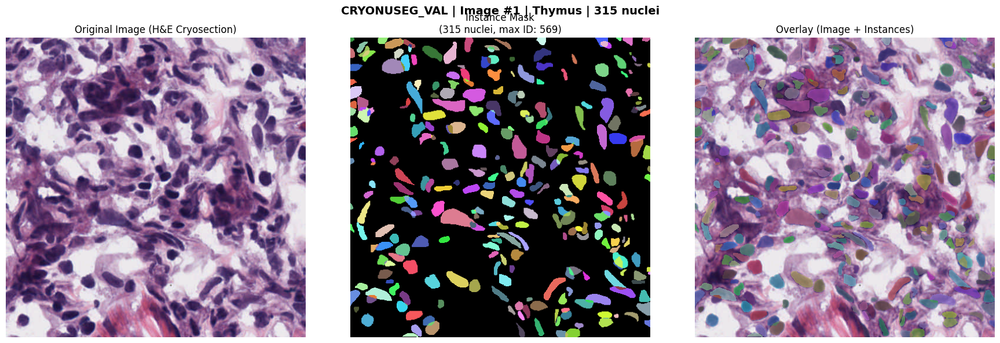

        ✅ Visualization complete

   [2/3] Image #4
        Nuclei count: 131
        Nuclei size range: 1-788 pixels (avg: 300)
        Organ type: AdrenalGland
        Original file: Human_AdrenalGland_02.tif


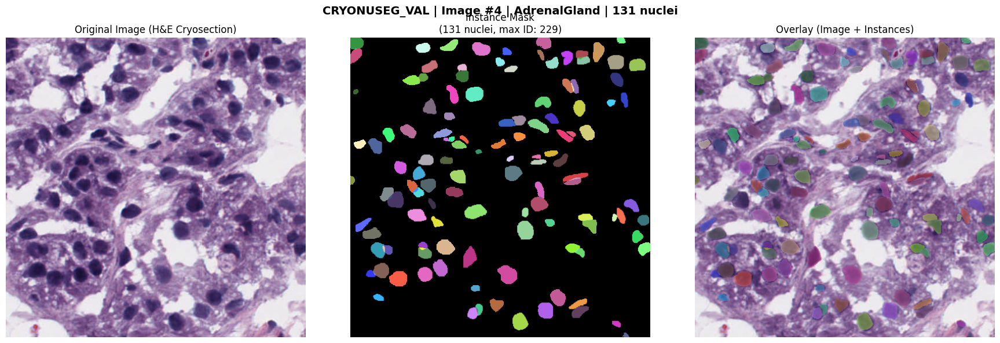

        ✅ Visualization complete

   [3/3] Image #2
        Nuclei count: 674
        Nuclei size range: 1-729 pixels (avg: 210)
        Organ type: Mediastinum
        Original file: Human_Mediastinum_01.tif


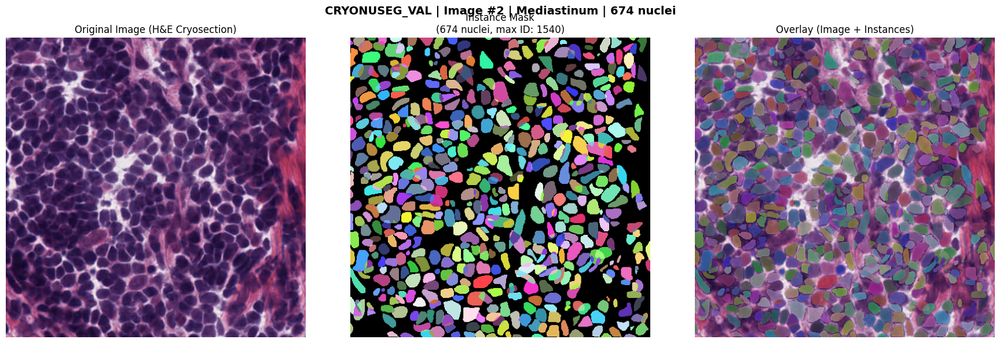

        ✅ Visualization complete

──────────────────────────────────────────────────────────────────────
📊 CRYONUSEG_TEST
   Total images: 5
   Showing: 3 random images
──────────────────────────────────────────────────────────────────────

   [1/3] Image #0
        Nuclei count: 125
        Nuclei size range: 1-1334 pixels (avg: 315)
        Organ type: ThyroidGland
        Original file: Human_ThyroidGland_01.tif


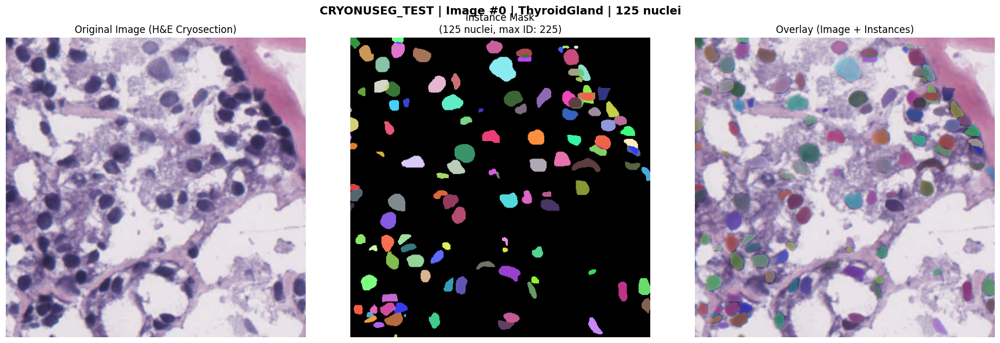

        ✅ Visualization complete

   [2/3] Image #4
        Nuclei count: 598
        Nuclei size range: 1-656 pixels (avg: 214)
        Organ type: LymphNodes
        Original file: Human_LymphNodes_03.tif


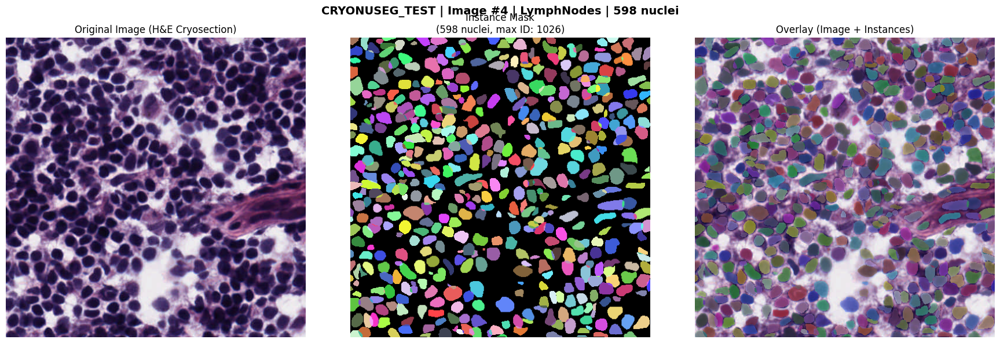

        ✅ Visualization complete

   [3/3] Image #2
        Nuclei count: 256
        Nuclei size range: 1-2487 pixels (avg: 276)
        Organ type: Testes
        Original file: Human_Testes_03.tif


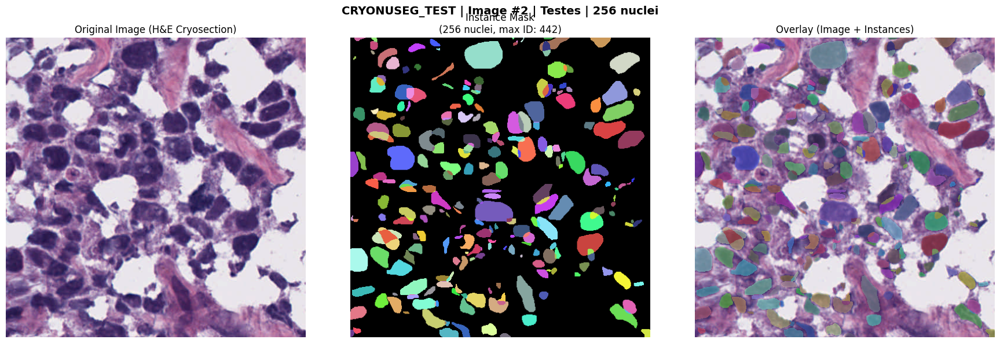

        ✅ Visualization complete

✅ Dataset inspection complete!


In [7]:
import zarr
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from pathlib import Path

# --- CONFIGURATION ---
ZARR_DATA_ROOT = Path("/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/cryonuseg/zarr_data")

def colorize_instances(mask):
    """
    Creates a random RGB color map for an instance mask.
    Background (0) is always Black.
    Each unique instance ID gets a unique color.
    """
    max_id = int(mask.max())
    if max_id == 0:
        return np.zeros((*mask.shape, 3), dtype=np.uint8)
    
    # Create a random color for every possible ID
    # Using a fixed seed so colors are consistent for the same mask, 
    # but random across IDs.
    np.random.seed(42) 
    colors = np.random.randint(50, 255, size=(max_id + 1, 3), dtype=np.uint8)
    
    # Force background to black
    colors[0] = [0, 0, 0]
    
    # Map the IDs to colors
    colored_mask = colors[mask]
    return colored_mask

def get_instance_stats(mask):
    """Get statistics about instances in the mask"""
    unique_ids = np.unique(mask)
    num_instances = len(unique_ids[unique_ids > 0])  # Exclude background
    
    instance_sizes = []
    for inst_id in unique_ids:
        if inst_id > 0:
            size = np.sum(mask == inst_id)
            instance_sizes.append(size)
    
    return {
        'num_instances': num_instances,
        'min_size': min(instance_sizes) if instance_sizes else 0,
        'max_size': max(instance_sizes) if instance_sizes else 0,
        'avg_size': np.mean(instance_sizes) if instance_sizes else 0
    }

def visualize_dataset(root_path, samples_per_split=5):
    """
    Visualize random samples from the CryoNuSeg zarr dataset.
    Works with cryonuseg_train, cryonuseg_val, cryonuseg_test directories.
    """
    
    print("=" * 70)
    print(f"👀 INSPECTING CryoNuSeg ZARR DATA AT: {root_path}")
    print("=" * 70)
    
    if not root_path.exists():
        print(f"\n❌ Path not found: {root_path}")
        return
    
    # Get all split directories
    splits = ['cryonuseg_train', 'cryonuseg_val', 'cryonuseg_test']
    available_splits = [s for s in splits if (root_path / s).exists()]
    
    if not available_splits:
        print(f"\n⚠️  No split directories found in {root_path}")
        return
    
    print(f"\n{'─' * 70}")
    print(f"📂 CryoNuSeg DATASET")
    print(f"   Available splits: {', '.join(available_splits)}")
    print(f"{'─' * 70}")
    
    for split_name in available_splits:
        split_path = root_path / split_name
        
        try:
            # Open zarr arrays
            z_img = zarr.open(str(split_path / "images.zarr"), mode='r')
            z_msk = zarr.open(str(split_path / "nuclei_masks.zarr"), mode='r')
            
            # Get metadata if available
            metadata_path = split_path / "metadata.csv"
            if metadata_path.exists():
                import pandas as pd
                metadata = pd.read_csv(metadata_path)
            else:
                metadata = None
            
            num_images = z_img.shape[0]
            
            print(f"\n{'─' * 70}")
            print(f"📊 {split_name.upper()}")
            print(f"   Total images: {num_images}")
            print(f"   Showing: {min(samples_per_split, num_images)} random images")
            print(f"{'─' * 70}")
            
            # Randomly select images to visualize
            num_samples = min(samples_per_split, num_images)
            random_indices = random.sample(range(num_images), num_samples)
            
            for sample_idx, idx in enumerate(random_indices, 1):
                img = z_img[idx]
                mask = z_msk[idx]
                
                # Get instance statistics
                stats = get_instance_stats(mask)
                
                # Print info
                print(f"\n   [{sample_idx}/{num_samples}] Image #{idx}")
                print(f"        Nuclei count: {stats['num_instances']}")
                if stats['num_instances'] > 0:
                    print(f"        Nuclei size range: {stats['min_size']}-{stats['max_size']} pixels (avg: {stats['avg_size']:.0f})")
                
                if metadata is not None:
                    img_meta = metadata.iloc[idx]
                    print(f"        Organ type: {img_meta['organ_type']}")
                    print(f"        Original file: {img_meta['original_file']}")
                
                # --- PLOTTING ---
                fig, ax = plt.subplots(1, 3, figsize=(18, 6))
                
                organ_info = ""
                if metadata is not None:
                    organ_info = f" | {metadata.iloc[idx]['organ_type']}"
                
                fig.suptitle(
                    f"{split_name.upper()} | Image #{idx}{organ_info} | {stats['num_instances']} nuclei",
                    fontsize=14,
                    fontweight='bold'
                )
                
                # 1. Original Image
                ax[0].imshow(img)
                ax[0].set_title("Original Image (H&E Cryosection)", fontsize=12)
                ax[0].axis('off')
                
                # 2. Instance Mask (Random Colors)
                colored_mask = colorize_instances(mask)
                ax[1].imshow(colored_mask)
                ax[1].set_title(
                    f"Instance Mask\n({stats['num_instances']} nuclei, max ID: {mask.max()})",
                    fontsize=12
                )
                ax[1].axis('off')
                
                # 3. Overlay
                overlay_img = img.copy().astype(float)
                
                # Create alpha channel based on mask
                alpha = np.where(mask > 0, 0.5, 0.0)  # 50% transparency for nuclei
                
                # Blend the colored mask with the original image
                for c in range(3):
                    overlay_img[:, :, c] = (
                        img[:, :, c] * (1 - alpha) + 
                        colored_mask[:, :, c] * alpha
                    )
                
                overlay_img = overlay_img.astype(np.uint8)
                
                ax[2].imshow(overlay_img)
                ax[2].set_title("Overlay (Image + Instances)", fontsize=12)
                ax[2].axis('off')
                
                plt.tight_layout()
                plt.show()
                print(f"        ✅ Visualization complete")
            
        except Exception as e:
            print(f"\n        ❌ Error reading {split_name}: {e}")
            import traceback
            traceback.print_exc()
    
    print("\n" + "=" * 70)
    print("✅ Dataset inspection complete!")
    print("=" * 70)

def print_dataset_summary(root_path):
    """Print summary statistics for the entire CryoNuSeg dataset"""
    
    print("\n" + "=" * 70)
    print("📊 CryoNuSeg DATASET SUMMARY")
    print("=" * 70)
    
    if not root_path.exists():
        print(f"❌ Path not found: {root_path}")
        return
    
    splits = ['cryonuseg_train', 'cryonuseg_val', 'cryonuseg_test']
    available_splits = [s for s in splits if (root_path / s).exists()]
    
    if not available_splits:
        print("⚠️  No split directories found")
        return
    
    total_images = 0
    total_nuclei = 0
    split_info = []
    
    for split_name in available_splits:
        split_path = root_path / split_name
        
        try:
            z_msk = zarr.open(str(split_path / "nuclei_masks.zarr"), mode='r')
            num_images = z_msk.shape[0]
            total_images += num_images
            
            # Count nuclei in all images (small dataset, can count all)
            split_nuclei = 0
            
            for img_idx in range(num_images):
                mask = z_msk[img_idx]
                unique_ids = np.unique(mask)
                split_nuclei += len(unique_ids[unique_ids > 0])
            
            total_nuclei += split_nuclei
            
            split_info.append({
                'name': split_name,
                'images': num_images,
                'nuclei': split_nuclei
            })
            
        except Exception as e:
            print(f"⚠️  Error processing {split_name}: {e}")
    
    print(f"\nTotal splits: {len(available_splits)}")
    print(f"Total images: {total_images}")
    print(f"Total nuclei: {total_nuclei}")
    if total_images > 0:
        print(f"Avg nuclei/image: {total_nuclei/total_images:.1f}")
    
    print(f"\n{'─' * 70}")
    print("Per-split breakdown:")
    print(f"{'─' * 70}")
    for info in split_info:
        avg_per_image = info['nuclei'] / info['images'] if info['images'] > 0 else 0
        print(f"   {info['name']}: {info['images']} images, {info['nuclei']} nuclei (avg: {avg_per_image:.1f}/image)")
    
    # Organ distribution from metadata
    print(f"\n{'─' * 70}")
    print("Organ type distribution:")
    print(f"{'─' * 70}")
    
    for split_name in available_splits:
        split_path = root_path / split_name
        metadata_path = split_path / "metadata.csv"
        
        if metadata_path.exists():
            import pandas as pd
            metadata = pd.read_csv(metadata_path)
            organ_counts = metadata['organ_type'].value_counts()
            
            print(f"\n   {split_name}:")
            for organ, count in organ_counts.items():
                print(f"      {organ}: {count} images")
    
    print("\n" + "=" * 70)

def verify_data_integrity(root_path):
    """Check for common issues in the dataset"""
    print("\n" + "=" * 70)
    print("🔍 DATA INTEGRITY CHECK")
    print("=" * 70)
    
    if not root_path.exists():
        print(f"❌ Path not found: {root_path}")
        return
    
    splits = ['cryonuseg_train', 'cryonuseg_val', 'cryonuseg_test']
    available_splits = [s for s in splits if (root_path / s).exists()]
    
    issues = []
    
    for split_name in available_splits:
        split_path = root_path / split_name
        
        # Check for required files
        if not (split_path / "images.zarr").exists():
            issues.append(f"{split_name}: Missing images.zarr")
        if not (split_path / "nuclei_masks.zarr").exists():
            issues.append(f"{split_name}: Missing nuclei_masks.zarr")
        if not (split_path / "metadata.csv").exists():
            issues.append(f"{split_name}: Missing metadata.csv")
        
        try:
            z_img = zarr.open(str(split_path / "images.zarr"), mode='r')
            z_msk = zarr.open(str(split_path / "nuclei_masks.zarr"), mode='r')
            
            # Check shape consistency
            if z_img.shape[0] != z_msk.shape[0]:
                issues.append(f"{split_name}: Image/mask count mismatch ({z_img.shape[0]} vs {z_msk.shape[0]})")
            
            # Check image dimensions (CryoNuSeg images are 512x512)
            if z_img.shape[1:3] != (512, 512):
                issues.append(f"{split_name}: Incorrect image size {z_img.shape[1:3]}, expected (512, 512)")
            if z_msk.shape[1:3] != (512, 512):
                issues.append(f"{split_name}: Incorrect mask size {z_msk.shape[1:3]}, expected (512, 512)")
            
            # Check data types
            if z_img.dtype != np.uint8:
                issues.append(f"{split_name}: Image dtype should be uint8, got {z_img.dtype}")
            if z_msk.dtype != np.int32:
                issues.append(f"{split_name}: Mask dtype should be int32, got {z_msk.dtype}")
            
            # Check number of channels
            if len(z_img.shape) != 4 or z_img.shape[3] != 3:
                issues.append(f"{split_name}: Image should have 3 channels (RGB), got shape {z_img.shape}")
            
            # Sample check: verify images have nuclei
            has_nuclei = False
            empty_images = []
            
            for idx in range(z_msk.shape[0]):  # Check all images (small dataset)
                max_id = z_msk[idx].max()
                if max_id > 0:
                    has_nuclei = True
                else:
                    empty_images.append(idx)
            
            if not has_nuclei:
                issues.append(f"{split_name}: ERROR - No nuclei found in any image!")
            elif len(empty_images) > 0:
                issues.append(f"{split_name}: Warning - {len(empty_images)} images have no nuclei: {empty_images}")
            
            # Check metadata consistency
            metadata_path = split_path / "metadata.csv"
            if metadata_path.exists():
                import pandas as pd
                metadata = pd.read_csv(metadata_path)
                
                if len(metadata) != z_img.shape[0]:
                    issues.append(f"{split_name}: Metadata row count ({len(metadata)}) doesn't match image count ({z_img.shape[0]})")
                
                # Check required columns
                required_cols = ['organ_type', 'original_file', 'original_height', 'original_width']
                missing_cols = [col for col in required_cols if col not in metadata.columns]
                if missing_cols:
                    issues.append(f"{split_name}: Missing metadata columns: {missing_cols}")
                
                # Check for valid organ types
                if 'organ_type' in metadata.columns:
                    unique_organs = metadata['organ_type'].unique()
                    print(f"\n   {split_name}: Found {len(unique_organs)} organ types: {', '.join(unique_organs)}")
            
            # Check instance ID continuity
            print(f"\n   {split_name}: Checking instance IDs...")
            non_contiguous = []
            for idx in range(min(5, z_msk.shape[0])):  # Check first 5 images
                mask = z_msk[idx]
                unique_ids = np.unique(mask)
                unique_ids = unique_ids[unique_ids > 0]  # Remove background
                
                if len(unique_ids) > 0:
                    max_id = unique_ids.max()
                    expected_count = max_id
                    actual_count = len(unique_ids)
                    
                    if actual_count != expected_count:
                        non_contiguous.append(f"Image {idx}: {actual_count} instances but max ID is {max_id}")
            
            if non_contiguous:
                print(f"      ⚠️  Non-contiguous instance IDs detected:")
                for msg in non_contiguous[:3]:  # Show first 3
                    print(f"         {msg}")
            else:
                print(f"      ✅ Instance IDs look good")
                
        except Exception as e:
            issues.append(f"{split_name}: Error reading zarr - {e}")
    
    print(f"\n{'─' * 70}")
    if issues:
        print("\n⚠️  Issues found:")
        for issue in issues:
            print(f"   • {issue}")
    else:
        print("\n✅ All checks passed! Dataset looks good.")
    
    print("\n" + "=" * 70)

def check_split_distribution(root_path):
    """Verify the train/val/test split distribution"""
    print("\n" + "=" * 70)
    print("📈 SPLIT DISTRIBUTION CHECK")
    print("=" * 70)
    
    if not root_path.exists():
        print(f"❌ Path not found: {root_path}")
        return
    
    splits = ['cryonuseg_train', 'cryonuseg_val', 'cryonuseg_test']
    available_splits = [s for s in splits if (root_path / s).exists()]
    
    split_counts = {}
    
    for split_name in available_splits:
        split_path = root_path / split_name
        
        try:
            z_img = zarr.open(str(split_path / "images.zarr"), mode='r')
            split_counts[split_name] = z_img.shape[0]
        except Exception as e:
            print(f"⚠️  Error reading {split_name}: {e}")
    
    if split_counts:
        total = sum(split_counts.values())
        
        print(f"\nTotal images: {total}")
        print(f"\nSplit distribution:")
        for split_name, count in split_counts.items():
            percentage = (count / total * 100) if total > 0 else 0
            print(f"   {split_name}: {count} images ({percentage:.1f}%)")
        
        # Check if split is reasonable (70/15/15)
        if 'cryonuseg_train' in split_counts:
            train_pct = (split_counts['cryonuseg_train'] / total * 100) if total > 0 else 0
            if 65 <= train_pct <= 75:
                print(f"\n✅ Training split looks good ({train_pct:.1f}%)")
            else:
                print(f"\n⚠️  Training split is {train_pct:.1f}%, expected ~70%")
    
    print("\n" + "=" * 70)

if __name__ == "__main__":
    if ZARR_DATA_ROOT.exists():
        # First verify data integrity
        verify_data_integrity(ZARR_DATA_ROOT)
        
        # Check split distribution
        check_split_distribution(ZARR_DATA_ROOT)
        
        # Print overall summary
        print_dataset_summary(ZARR_DATA_ROOT)
        
        # Then visualize random samples
        print("\n")
        visualize_dataset(ZARR_DATA_ROOT, samples_per_split=3)
    else:
        print(f"❌ Path not found: {ZARR_DATA_ROOT}")
        print("   Please check your ZARR_DATA_ROOT configuration.")